# Step 1: Image **Segmentation**

In [ ]:
!pip install torch torchvision
!pip install opencv-python
!pip install matplotlib


In [ ]:
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import cv2
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.transforms import functional as F


In [ ]:
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:02<00:00, 62.6MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(in

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving file-6113d5f8845dc.jpeg to file-6113d5f8845dc (1).jpeg


In [ ]:
image_path = next(iter(uploaded))  # Get the name of the uploaded file
image = cv2.imread(image_path)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
image_tensor = F.to_tensor(image_rgb).unsqueeze(0)  # Convert to tensor and add batch dimension


In [ ]:
with torch.no_grad():
    predictions = model(image_tensor)


In [ ]:
masks = predictions[0]['masks']
boxes = predictions[0]['boxes']
scores = predictions[0]['scores']
labels = predictions[0]['labels']


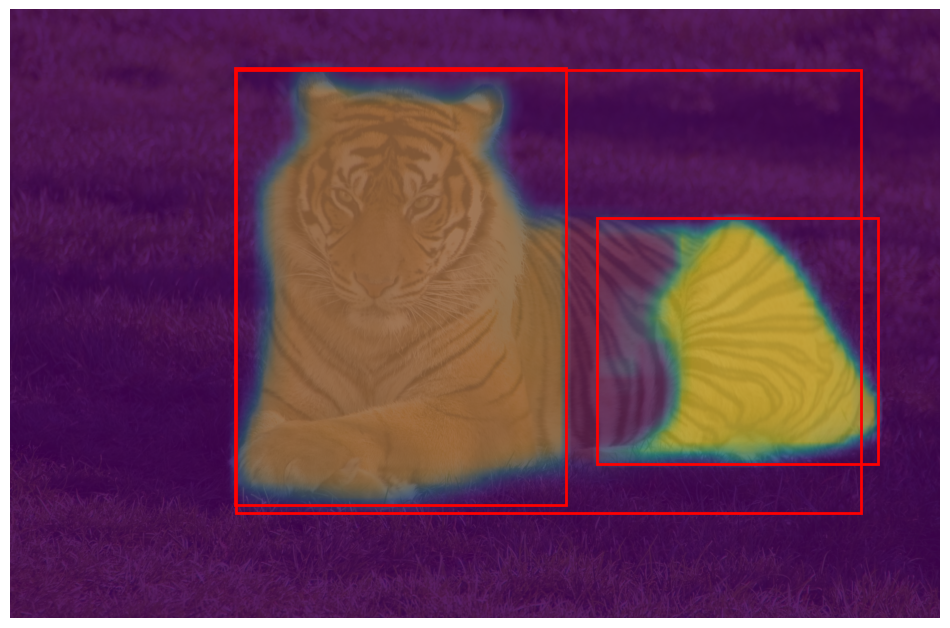

In [ ]:
def plot_segmentation(image, masks, boxes, labels, scores, threshold=0.5):
    plt.figure(figsize=(12, 12))
    plt.imshow(image)

    for i in range(len(masks)):
        if scores[i] > threshold:
            mask = masks[i, 0].mul(255).byte().cpu().numpy()  # Convert mask to numpy array
            plt.imshow(mask, alpha=0.5)  # Overlay mask on image
            box = boxes[i].cpu().numpy()
            plt.gca().add_patch(plt.Rectangle((box[0], box[1]), box[2] - box[0], box[3] - box[1],
                                               fill=False, color='red', linewidth=2))

    plt.axis('off')
    plt.show()

plot_segmentation(image_rgb, masks, boxes, labels, scores)


In [ ]:
import pandas as pd

def create_summary_table(labels, scores, boxes, threshold=0.5):
    data = []
    for i in range(len(labels)):
        if scores[i] > threshold:
            data.append({
                'Label': labels[i].item(),
                'Score': scores[i].item(),
                'Bounding Box': boxes[i].cpu().numpy().tolist()
            })
    return pd.DataFrame(data)

summary_df = create_summary_table(labels, scores, boxes)
print(summary_df)


   Label     Score                                       Bounding Box
0     24  0.954082  [557.2324829101562, 148.23956298828125, 2097.7...
1     17  0.567114  [554.1842041015625, 143.11563110351562, 1369.0...
2     24  0.553705  [1447.1666259765625, 514.5115966796875, 2138.5...


# STEP **2**

In [ ]:
!pip install opencv-python-headless
!pip install sqlite3
!pip install pillow



In [ ]:
from google.colab import files
uploaded = files.upload()


Saving file-6113d5f8845dc.jpeg to file-6113d5f8845dc (2).jpeg


In [ ]:
import cv2
import numpy as np

# Read the image
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)


In [ ]:
# Convert to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply a binary threshold to create a mask
_, mask = cv2.threshold(gray_image, 128, 255, cv2.THRESH_BINARY)

# Find contours (segmented objects)
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


In [ ]:
import os

os.makedirs('extracted_objects', exist_ok=True)


In [ ]:
import sqlite3

# Create SQLite database for metadata
conn = sqlite3.connect('objects.db')
c = conn.cursor()
c.execute('''CREATE TABLE IF NOT EXISTS objects
             (master_id TEXT, unique_id TEXT, file_path TEXT)''')

master_id = os.path.splitext(image_path)[0]  # Use image name as master ID

for idx, contour in enumerate(contours):
    # Create a mask for each contour
    object_mask = np.zeros(gray_image.shape, dtype=np.uint8)
    cv2.drawContours(object_mask, [contour], -1, 255, thickness=cv2.FILLED)

    # Extract the object
    segmented_object = cv2.bitwise_and(image, image, mask=object_mask)

    # Create a unique ID for the object
    unique_id = f"{master_id}_{idx}"

    # Save the object
    save_path = f"extracted_objects/{unique_id}.png"
    cv2.imwrite(save_path, segmented_object)

    # Store metadata in the database
    c.execute("INSERT INTO objects (master_id, unique_id, file_path) VALUES (?, ?, ?)",
              (master_id, unique_id, save_path))

conn.commit()


In [ ]:
import matplotlib.pyplot as plt

# Display each extracted object
extracted_files = os.listdir('extracted_objects')
for file in extracted_files:
    img = cv2.imread(f'extracted_objects/{file}')
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title(file)
    plt.axis('off')
    plt.show()


In [ ]:
# Query metadata from the database
c.execute("SELECT * FROM objects")
rows = c.fetchall()
for row in rows:
    print(row)

# Close the database connection
conn.close()

Streaming output truncated to the last 5000 lines.
('file-6113d5f8845dc', 'file-6113d5f8845dc_2456', 'extracted_objects/file-6113d5f8845dc_2456.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2457', 'extracted_objects/file-6113d5f8845dc_2457.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2458', 'extracted_objects/file-6113d5f8845dc_2458.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2459', 'extracted_objects/file-6113d5f8845dc_2459.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2460', 'extracted_objects/file-6113d5f8845dc_2460.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2461', 'extracted_objects/file-6113d5f8845dc_2461.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2462', 'extracted_objects/file-6113d5f8845dc_2462.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2463', 'extracted_objects/file-6113d5f8845dc_2463.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2464', 'extracted_objects/file-6113d5f8845dc_2464.png')
('file-6113d5f8845dc', 'file-6113d5f8845dc_2465', 'extract

# **STEP 3**

In [ ]:
import torch

# Load YOLOv5 model
model = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-9-25 Python-3.10.12 torch-2.4.1+cu121 CPU

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


In [ ]:
from transformers import CLIPProcessor, CLIPModel

# Load CLIP model
device = 'cuda' if torch.cuda.is_available() else 'cpu'
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
# Install the required libraries
!pip install torch torchvision opencv-python matplotlib


In [ ]:
# Clone the YOLOv5 repository and install dependencies
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
!pip install -r requirements.txt


fatal: destination path 'yolov5' already exists and is not an empty directory.
/content/yolov5


In [ ]:
import torch

# Load a pre-trained YOLOv5 model (e.g., yolov5s)
model = torch.hub.load('ultralytics/yolov5', 'yolov5s')  # Use 'yolov5s', 'yolov5m', 'yolov5l', or 'yolov5x'


Using cache found in /root/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-9-25 Python-3.10.12 torch-2.4.1+cu121 CPU

100%|██████████| 14.1M/14.1M [00:00<00:00, 40.8MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients, 16.4 GFLOPs
Adding AutoShape... 


Saving file-6113d5f8845dc.jpeg to file-6113d5f8845dc.jpeg


/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:892: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


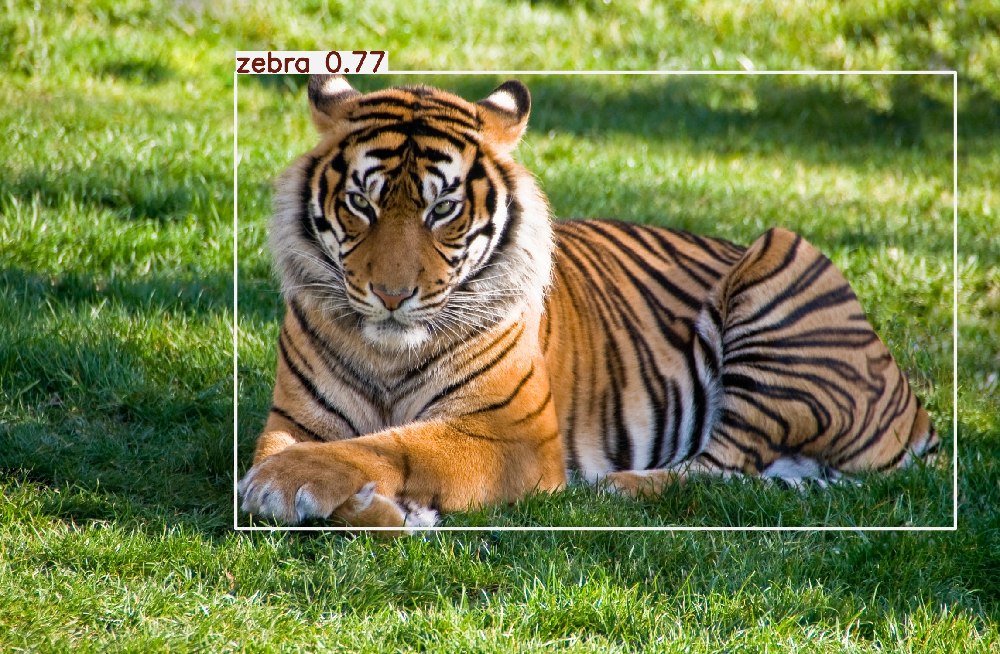

In [ ]:
from google.colab import files
from PIL import Image

# Upload an image
uploaded = files.upload()  # Upload an image (e.g., 'example.jpg')
img_path = list(uploaded.keys())[0]

# Perform object detection
results = model(img_path)

# Display the results
results.show()


In [ ]:
# Get the results in pandas dataframe format
detections = results.pandas().xyxy[0]  # xyxy format: [xmin, ymin, xmax, ymax, confidence, class, name]

# Print the detected objects
print(detections[['name', 'confidence', 'xmin', 'ymin', 'xmax', 'ymax']])


    name  confidence        xmin        ymin         xmax         ymax
0  zebra     0.77205  540.123169  165.922302  2189.769531  1212.448975


In [ ]:
import matplotlib.pyplot as plt
import cv2

# Read the image
img = cv2.imread(img_path)  # Replace with your image path
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Draw bounding boxes and labels
for _, row in detections.iterrows():
    # Get bounding box coordinates
    xmin, ymin, xmax, ymax = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])

    # Draw the rectangle
    cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 2)

    # Put the label near the bounding box
    label = f"{row['name']} ({row['confidence']:.2f})"
    cv2.putText(img, label, (xmin, ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Show the image with bounding boxes
plt.imshow(img)
plt.axis('off')
plt.show()


In [ ]:
# Save the result
cv2.imwrite('detected_objects.jpg', img)


True

In [ ]:
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").cpu()


In [ ]:
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")


/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


In [ ]:
!pip install torch torchvision transformers pillow opencv-python


In [ ]:
import torch
print("CUDA available:", torch.cuda.is_available())


CUDA available: False


# STEP 4

In [ ]:
# Install Tesseract OCR and EasyOCR
!apt-get install -y tesseract-ocr
!pip install pytesseract
!pip install easyocr
!pip install opencv-python-headless  # For image pre-processing


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 3s (1,773 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 123605 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
import cv2
import pytesseract
import easyocr
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Example: Load image using OpenCV or PIL
image_path = '/content/file-6113d5f8845dc.jpeg'  # Replace with your image path
image = cv2.imread(image_path)
# Convert to RGB (optional, depending on your image format)
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


In [ ]:
# Convert image to PIL format (Tesseract works well with PIL)
pil_image = Image.fromarray(image_rgb)

# Use Tesseract to extract text
text = pytesseract.image_to_string(pil_image)

print("Extracted Text using Tesseract:")
print(text)


Extracted Text using Tesseract:
 
 

  
 
 

—
_-
ra

      
 
      

|
US it Aan |

ve / ri ee woh wet

mee ee we ee

bias ba WU ) m a e , Vy,
Y

PSY fa

Rh

3 ’ ij Te
ae
a"

  
 

‘ me 1%
rik , ages Ae A

‘ asi , a . x ApS : i

: As Lt

at he

  
 



In [ ]:
# Initialize the EasyOCR reader
reader = easyocr.Reader(['en'])  # Specify language(s)

# Use EasyOCR to extract text
result = reader.readtext(image_rgb)

# Extract and print the text
extracted_text = ' '.join([res[1] for res in result])
print("Extracted Text using EasyOCR:")
print(extracted_text)


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% CompleteExtracted Text using EasyOCR:
L


In [ ]:
# Store extracted data in a dictionary
extracted_data = {
    'image_path': image_path,
    'text_tesseract': text,
    'text_easyocr': extracted_text
}

# Optionally, save the data to a file
import json

with open('extracted_data.json', 'w') as f:
    json.dump(extracted_data, f)

print("Text data saved to 'extracted_data.json'")


Text data saved to 'extracted_data.json'


In [ ]:
import pandas as pd

# Convert dictionary to DataFrame
df = pd.DataFrame([extracted_data])

# Save to CSV
df.to_csv('extracted_text_data.csv', index=False)

print("Extracted text data saved to 'extracted_text_data.csv'")


Extracted text data saved to 'extracted_text_data.csv'


# STEP **5**

In [ ]:

!pip install transformers

from transformers import pipeline
import pandas as pd

# You can choose any summarization model here, e.g., `t5-small`, `distilbart-cnn-12-6`
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

objects_attributes = [
    {
        "name": "Bottle",
        "attributes": "A transparent plastic bottle filled with water. The label is blue and white. It's about 500ml in size."
    },
    {
        "name": "Book",
        "attributes": "A hardcover book with a red cover. The title is 'AI and Robotics'. It's 300 pages long and written by Dr. John Doe."
    },
    # Add more objects as needed
]

summarized_objects = []
for obj in objects_attributes:
    obj_summary = summarizer(obj['attributes'], max_length=50, min_length=25, do_sample=False)[0]['summary_text']
    summarized_objects.append({
        'name': obj['name'],
        'summary': obj_summary
    })

summary_df = pd.DataFrame(summarized_objects)
print(summary_df)

summary_df.to_csv('summarized_object_attributes.csv', index=False)


config.json:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Your max_length is set to 50, but your input_length is only 25. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=12)
Your max_length is set to 50, but your input_length is only 32. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=16)


     name                                            summary
0  Bottle  A transparent plastic bottle filled with water...
1    Book  A hardcover book with a red cover. The title i...


# **STEP 6**

In [ ]:
import json

master_image_id = "image_001"
objects_data = [
    {
        "object_id": "object_001",
        "name": "Bottle",
        "description": "A transparent plastic bottle filled with water.",
        "extracted_text": "Brand: Aquafina, Volume: 500ml",
        "summary": "A 500ml transparent plastic water bottle of the brand Aquafina."
    },
    {
        "object_id": "object_002",
        "name": "Book",
        "description": "A hardcover book with a red cover titled 'AI and Robotics'.",
        "extracted_text": "Title: AI and Robotics, Author: Dr. John Doe",
        "summary": "A hardcover book titled 'AI and Robotics' by Dr. John Doe."
    },
    # Add more objects as needed
]

mapping = {
    "master_image_id": master_image_id,
    "objects": objects_data
}

with open("object_mapping.json", "w") as json_file:
    json.dump(mapping, json_file, indent=4)

with open("object_mapping.json", "r") as json_file:
    loaded_mapping = json.load(json_file)
    print(json.dumps(loaded_mapping, indent=4))


{
    "master_image_id": "image_001",
    "objects": [
        {
            "object_id": "object_001",
            "name": "Bottle",
            "description": "A transparent plastic bottle filled with water.",
            "extracted_text": "Brand: Aquafina, Volume: 500ml",
            "summary": "A 500ml transparent plastic water bottle of the brand Aquafina."
        },
        {
            "object_id": "object_002",
            "name": "Book",
            "description": "A hardcover book with a red cover titled 'AI and Robotics'.",
            "extracted_text": "Title: AI and Robotics, Author: Dr. John Doe",
            "summary": "A hardcover book titled 'AI and Robotics' by Dr. John Doe."
        }
    ]
}


# **STEP 7**

In [ ]:
!pip install matplotlib pandas opencv-python

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import cv2
import json

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving file-6113d5f8845dc.jpeg to file-6113d5f8845dc (1).jpeg


In [ ]:
original_image_path = '/content/file-6113d5f8845dc.jpeg'
original_image = cv2.imread(original_image_path)
original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)

In [ ]:
plt.imshow(original_image)
plt.axis('off')  # Hide axis
plt.title("Original Image")
plt.show()

In [ ]:
uploaded = files.upload()

Saving file-6113d5f8845dc.jpeg to file-6113d5f8845dc (2).jpeg


In [ ]:
mapping_file_name = 'object_mapping.json'
with open(mapping_file_name, "r") as json_file:
    mapping_data = json.load(json_file)

In [ ]:
objects = mapping_data["objects"]

In [ ]:
summary_table = pd.DataFrame(objects)

In [ ]:
bbox_data = {
    "object_001": {"bbox": [50, 50, 150, 200], "label": "Bottle"},
    "object_002": {"bbox": [200, 100, 350, 300], "label": "Book"},
}

In [ ]:
annotated_image = original_image.copy()

In [ ]:
for obj in objects:
    obj_id = obj["object_id"]
    if obj_id in bbox_data:
        bbox = bbox_data[obj_id]["bbox"]
        label = bbox_data[obj_id]["label"]

        # Draw bounding box
        cv2.rectangle(annotated_image, (bbox[0], bbox[1]), (bbox[2], bbox[3]), (255, 0, 0), 2)

        # Put label text above the bounding box
        cv2.putText(annotated_image, label, (bbox[0], bbox[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)


In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# Show the annotated image
ax[0].imshow(annotated_image)
ax[0].set_title("Annotated Image")
ax[0].axis("off")

# Show the summary table
ax[1].axis("off")
table_data = ax[1].table(cellText=summary_table.values, colLabels=summary_table.columns, cellLoc='center', loc='center')
table_data.auto_set_font_size(False)
table_data.set_fontsize(10)
table_data.scale(1.2, 1.2)
ax[1].set_title("Object Summary Table")

Text(0.5, 1.0, 'Object Summary Table')

In [ ]:
plt.savefig('final_output.png', bbox_inches='tight')

In [ ]:
plt.tight_layout()
plt.show()